# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [2]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim,output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [4]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim*8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [6]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [8]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim,output_dim),
        torch.nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [9]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [10]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim,1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [11]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Make sure there's no sigmoid
    assert test_input.max() > 1
    assert test_input.min() < -1

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [12]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [14]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noisy_input = get_noise(num_images,z_dim,device)
    generated_images = gen(noisy_input).detach()
    disc_out_fake = disc(generated_images)
    target_zeros = torch.zeros_like(disc_out_fake)
    
    loss_fake = criterion(disc_out_fake,target_zeros)
    
    disc_out_real = disc(real)
    target_ones = torch.ones_like(disc_out_real)
    
    loss_real = criterion(disc_out_real,target_ones)
    
    disc_loss = (loss_real + loss_fake) / 2
    #### END CODE HERE ####
    return disc_loss

In [15]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [22]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noisy_input = get_noise(num_images,z_dim,device)
    generated_images = gen(noisy_input)
    discrim_preds = disc(generated_images)
    ground_labels = torch.ones_like(discrim_preds)
    gen_loss = criterion(discrim_preds, ground_labels)
    #### END CODE HERE ####
    return gen_loss

In [23]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.3997882947921747, discriminator loss: 0.4168509715199469


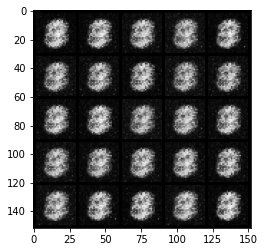

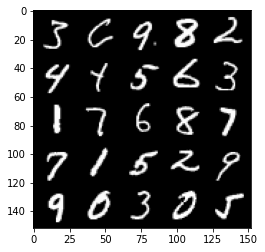

Step 1000: Generator loss: 1.7603565435409538, discriminator loss: 0.2771950997114184


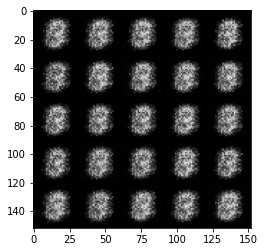

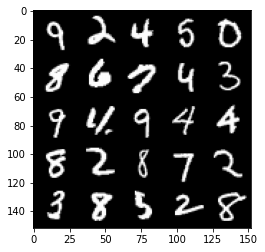

Step 1500: Generator loss: 2.0551954257488254, discriminator loss: 0.15978158587217314


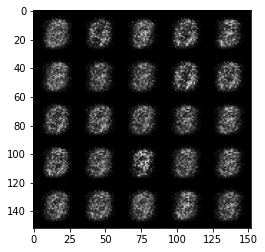

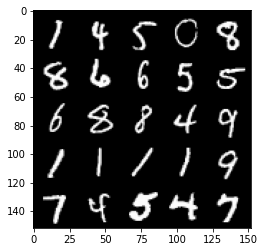

Step 2000: Generator loss: 1.6687749147415167, discriminator loss: 0.22546343216300035


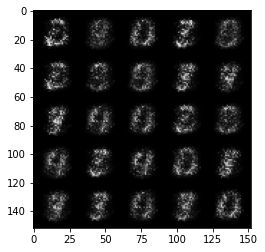

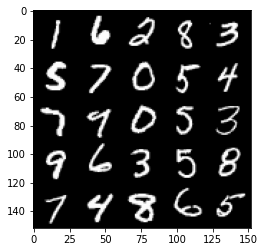

Step 2500: Generator loss: 1.669734372615815, discriminator loss: 0.20733785718679434


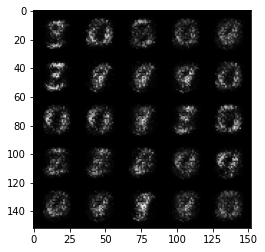

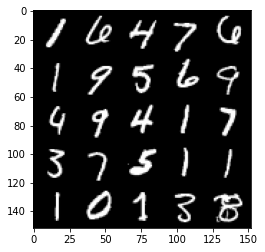

Step 3000: Generator loss: 1.879475975036622, discriminator loss: 0.17898578836023785


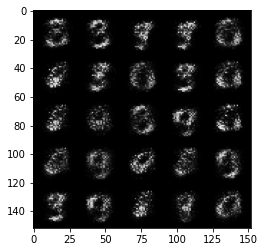

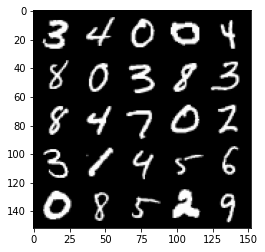

Step 3500: Generator loss: 2.300988264083863, discriminator loss: 0.13834914806485182


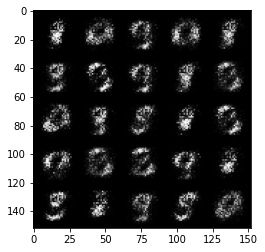

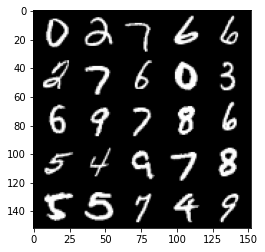

Step 4000: Generator loss: 2.7329273204803437, discriminator loss: 0.10840520994365213


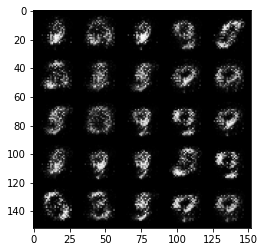

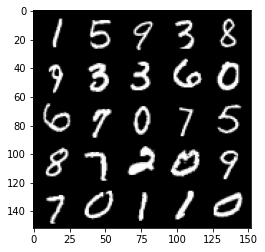

Step 4500: Generator loss: 3.166031254291533, discriminator loss: 0.0848819486573339


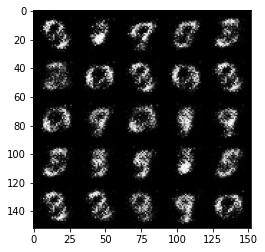

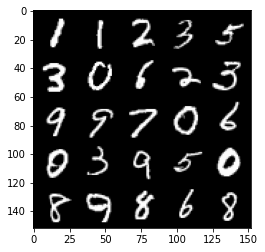

Step 5000: Generator loss: 3.483913284778595, discriminator loss: 0.06665854870527976


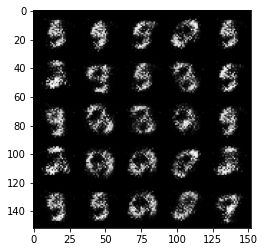

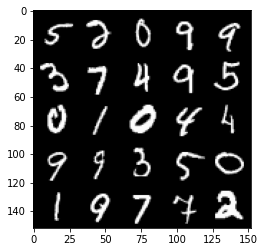

Step 5500: Generator loss: 3.7598607950210603, discriminator loss: 0.055382703043520456


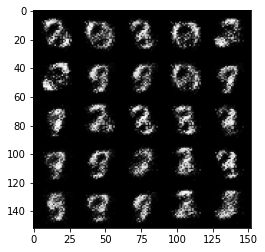

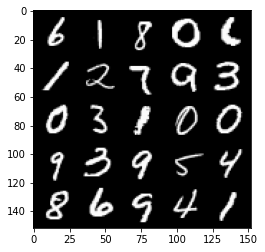

Step 6000: Generator loss: 4.040707386493686, discriminator loss: 0.04953718790784474


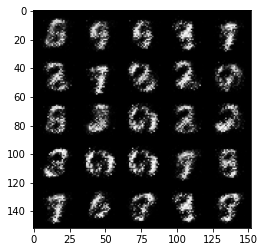

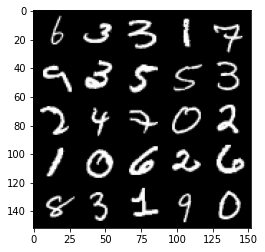

Step 6500: Generator loss: 4.192761833667753, discriminator loss: 0.04842541331797838


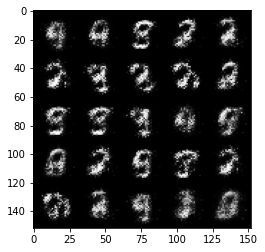

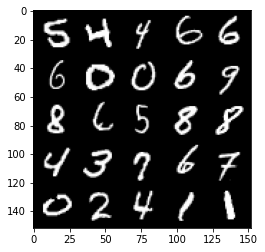

Step 7000: Generator loss: 4.220868773460388, discriminator loss: 0.04813131373375647


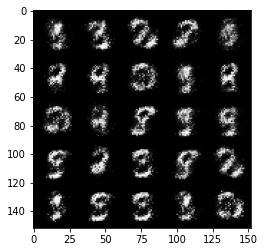

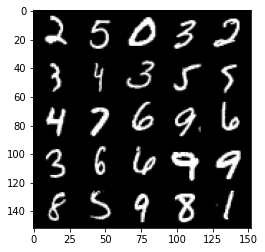

Step 7500: Generator loss: 4.453828931331628, discriminator loss: 0.04418781479075543


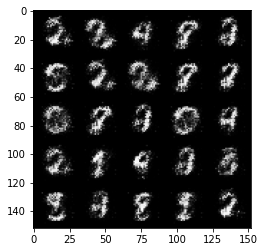

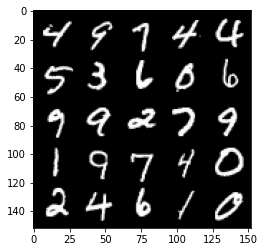

Step 8000: Generator loss: 4.335664743423462, discriminator loss: 0.05431874339655037


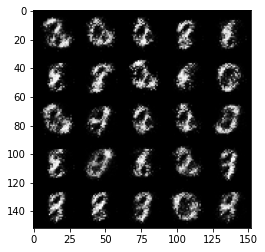

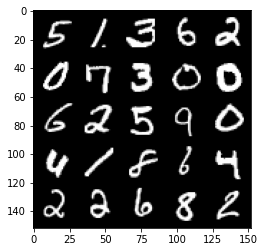

Step 8500: Generator loss: 4.237119895458222, discriminator loss: 0.05475688962265848


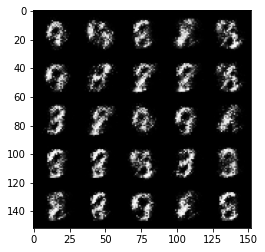

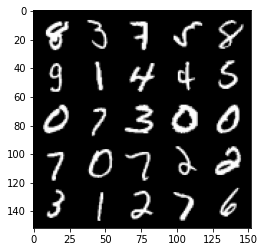

Step 9000: Generator loss: 4.20319714355469, discriminator loss: 0.054926108360290604


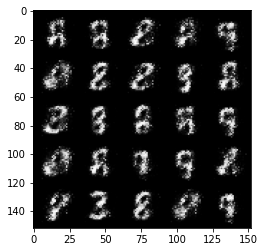

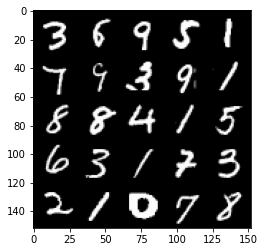

Step 9500: Generator loss: 4.1956441512107885, discriminator loss: 0.05607939084619283


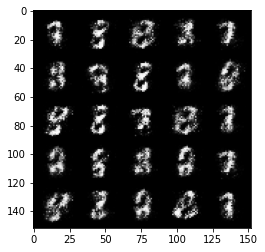

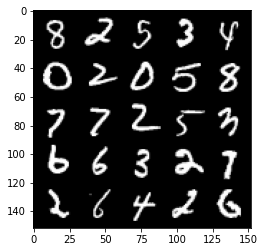

Step 10000: Generator loss: 4.26780096244812, discriminator loss: 0.05511690072715282


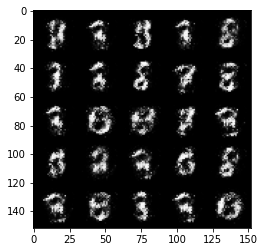

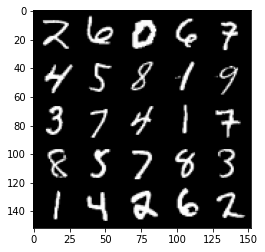

Step 10500: Generator loss: 4.403350373268131, discriminator loss: 0.05588040875270962


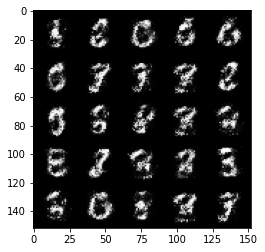

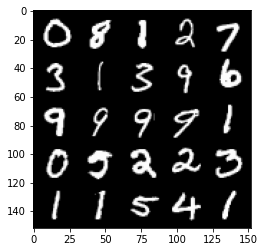

Step 11000: Generator loss: 4.302500412464146, discriminator loss: 0.0663730755373835


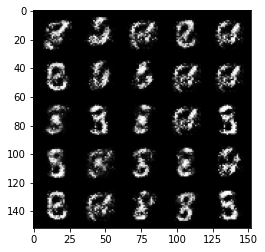

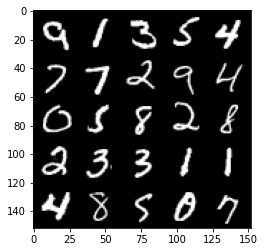

Step 11500: Generator loss: 4.082575579166414, discriminator loss: 0.07926912224292762


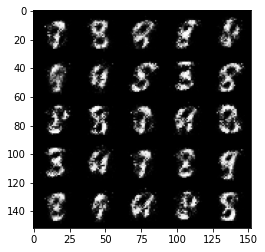

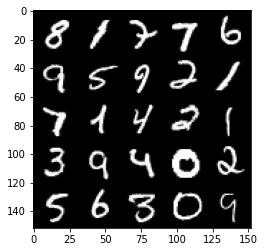

Step 12000: Generator loss: 3.9583591055870033, discriminator loss: 0.06760401993244879


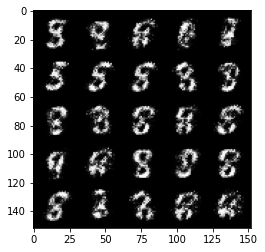

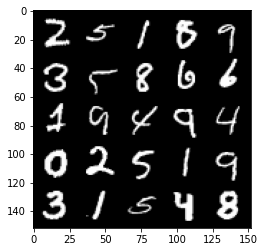

Step 12500: Generator loss: 4.192425711631774, discriminator loss: 0.07764541838318104


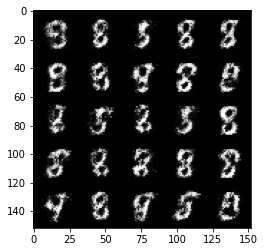

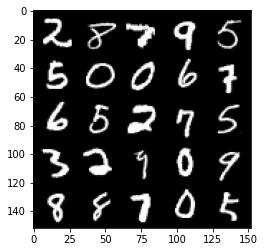

Step 13000: Generator loss: 4.137282025814055, discriminator loss: 0.08506152126193041


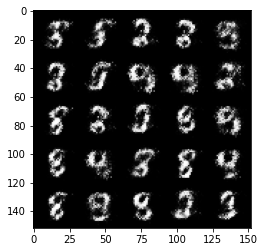

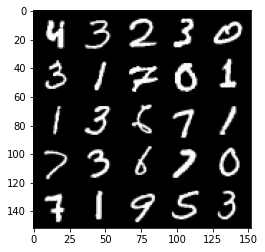

Step 13500: Generator loss: 4.1810636267662, discriminator loss: 0.1006667570322752


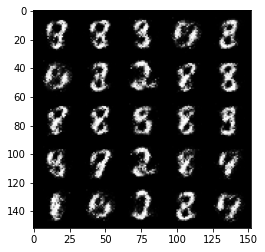

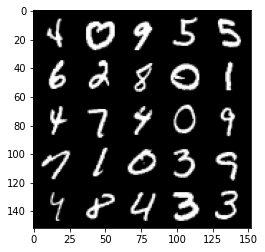

Step 14000: Generator loss: 3.904645986557006, discriminator loss: 0.10289010773599157


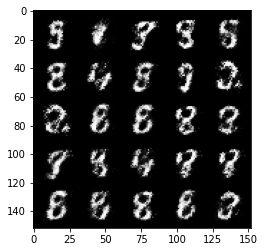

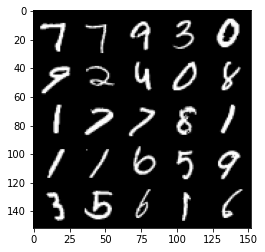

Step 14500: Generator loss: 4.034992490291597, discriminator loss: 0.08957135037332774


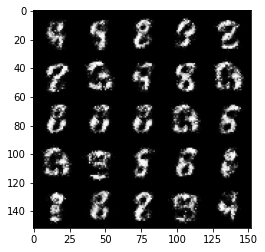

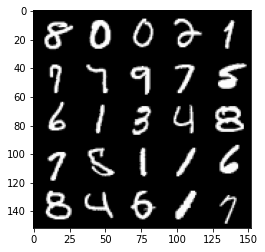

Step 15000: Generator loss: 4.014820947170259, discriminator loss: 0.1001460880339146


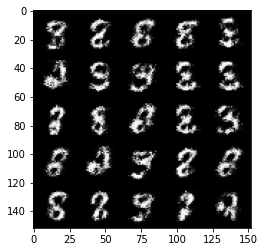

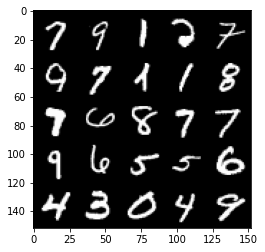

Step 15500: Generator loss: 3.9858099937439007, discriminator loss: 0.11352695084363208


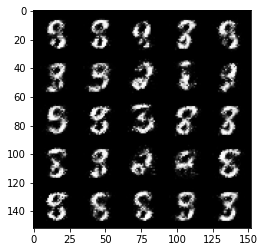

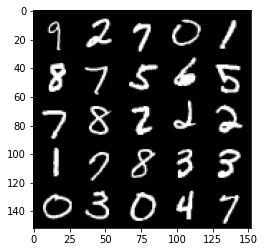

Step 16000: Generator loss: 3.830703331947328, discriminator loss: 0.13167888996005067


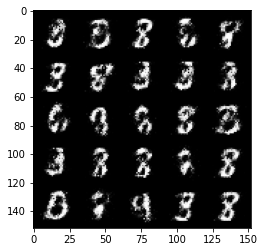

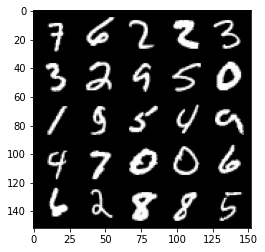

Step 16500: Generator loss: 3.7534413104057296, discriminator loss: 0.12592380693554883


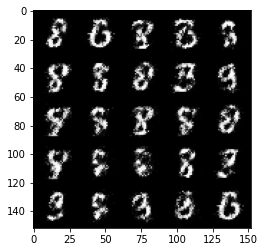

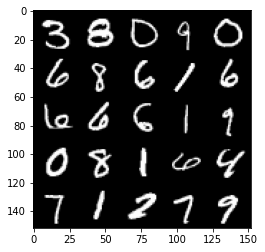

Step 17000: Generator loss: 3.754745782375336, discriminator loss: 0.11788083490729333


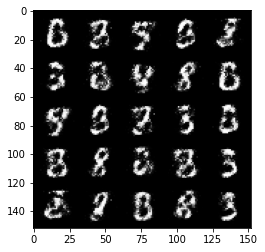

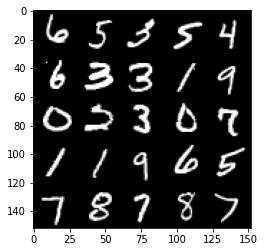

Step 17500: Generator loss: 3.5273991918563885, discriminator loss: 0.1555664326101541


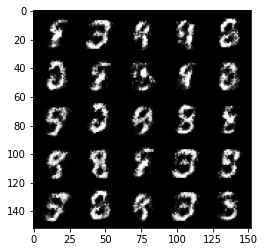

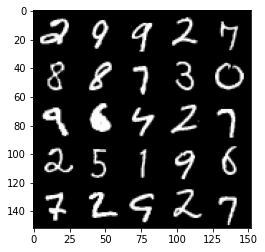

Step 18000: Generator loss: 3.413431532382968, discriminator loss: 0.15013446654379375


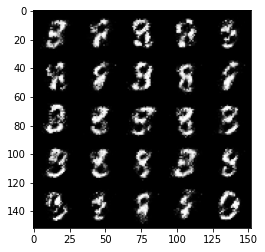

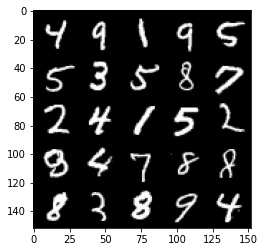

Step 18500: Generator loss: 3.417530045032501, discriminator loss: 0.1446758344471454


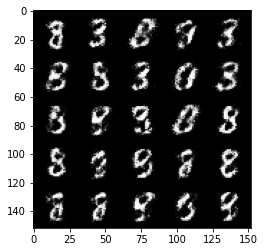

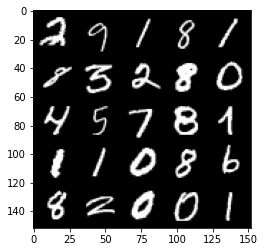

Step 19000: Generator loss: 3.30200648403168, discriminator loss: 0.15757034024596217


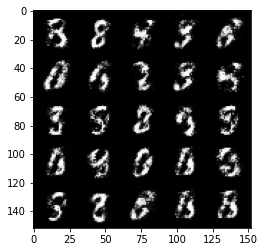

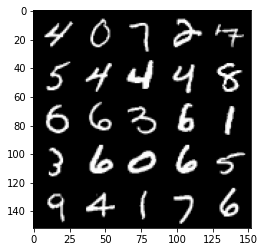

Step 19500: Generator loss: 3.351332178115843, discriminator loss: 0.13866559472680098


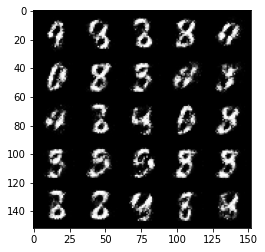

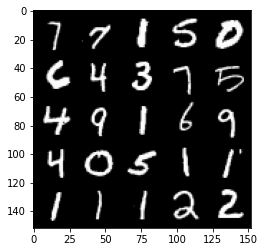

Step 20000: Generator loss: 3.407836075305939, discriminator loss: 0.1387971185967327


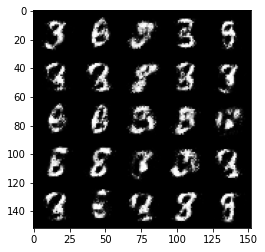

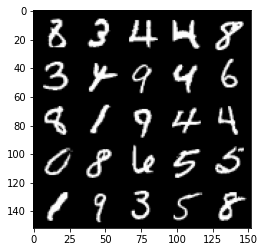

Step 20500: Generator loss: 3.2735560221672046, discriminator loss: 0.16151221139729005


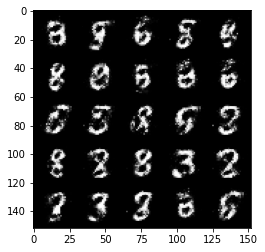

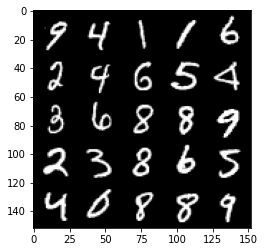

Step 21000: Generator loss: 3.1175734019279493, discriminator loss: 0.17988233795762065


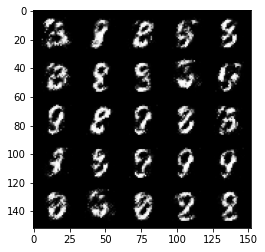

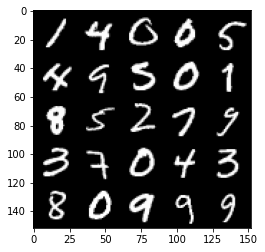

Step 21500: Generator loss: 3.301394594669342, discriminator loss: 0.1484692640006542


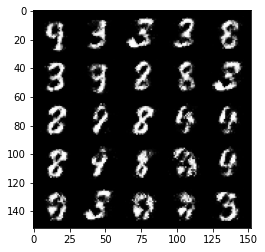

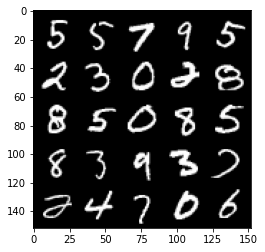

Step 22000: Generator loss: 3.1354326319694468, discriminator loss: 0.16252265472710137


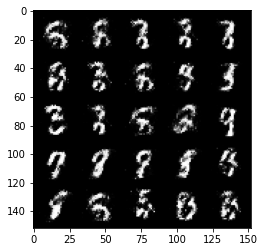

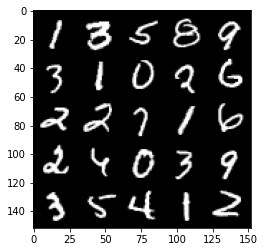

Step 22500: Generator loss: 3.0630936050415016, discriminator loss: 0.19088959564268587


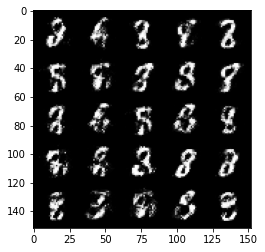

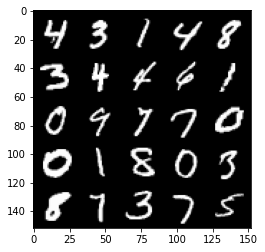

Step 23000: Generator loss: 2.8707708158493026, discriminator loss: 0.20350157138705247


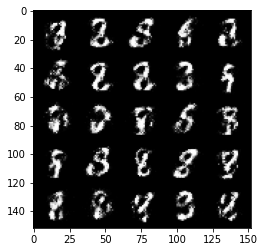

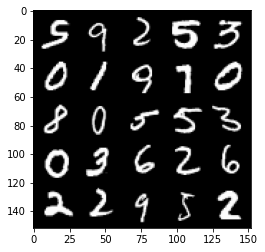

Step 23500: Generator loss: 3.0981451115608216, discriminator loss: 0.17591599950194362


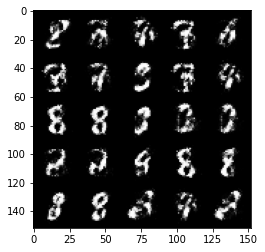

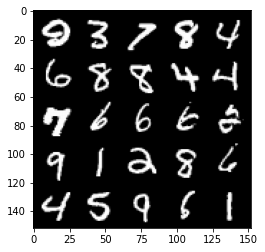

Step 24000: Generator loss: 3.1333518772125224, discriminator loss: 0.1660092656612396


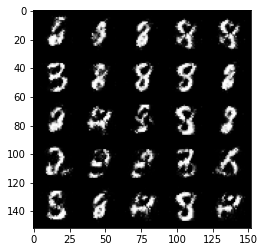

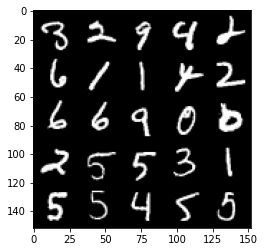

Step 24500: Generator loss: 3.082704190731052, discriminator loss: 0.17106964386999612


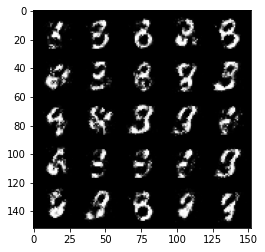

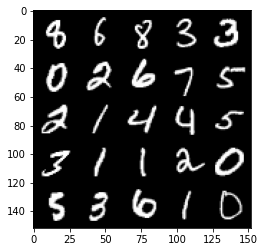

Step 25000: Generator loss: 3.1105454554557803, discriminator loss: 0.1681578369587661


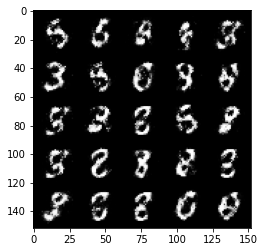

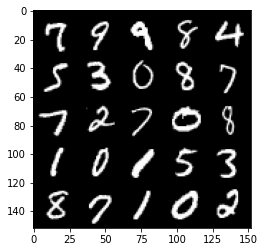

Step 25500: Generator loss: 2.9544255995750444, discriminator loss: 0.18346079504489904


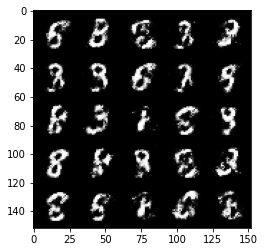

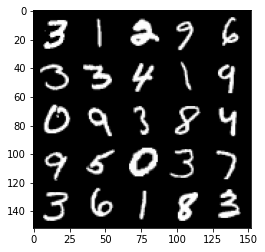

Step 26000: Generator loss: 2.916794320106507, discriminator loss: 0.18196461364626865


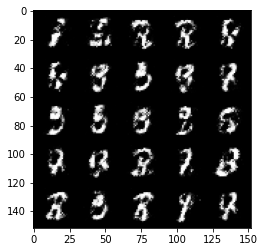

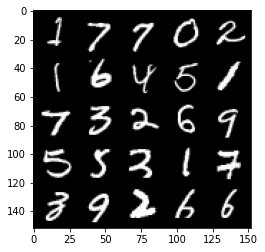

Step 26500: Generator loss: 2.950915161609647, discriminator loss: 0.18164777453243747


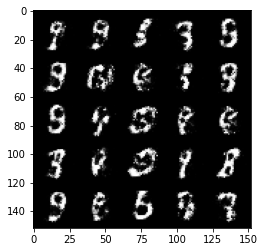

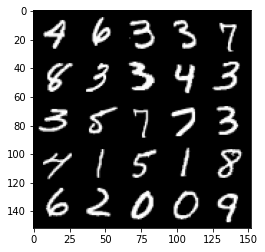

Step 27000: Generator loss: 2.8561076517105093, discriminator loss: 0.19879244621098027


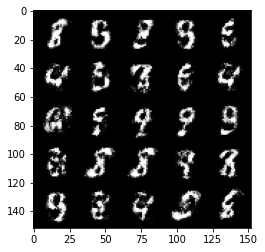

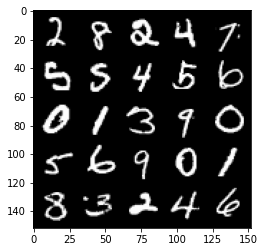

Step 27500: Generator loss: 2.872325297832487, discriminator loss: 0.19667598383128643


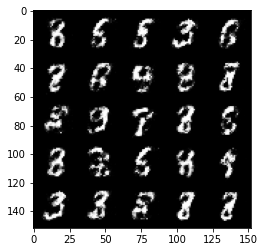

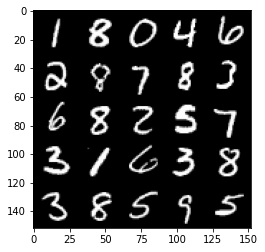

Step 28000: Generator loss: 2.818293479442596, discriminator loss: 0.20858065938949588


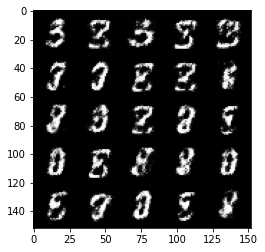

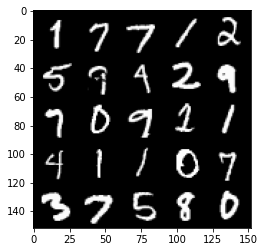

Step 28500: Generator loss: 2.719701702117919, discriminator loss: 0.21289227360486965


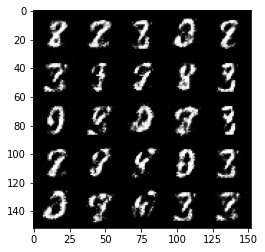

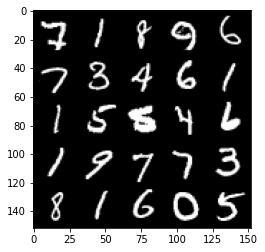

Step 29000: Generator loss: 2.803391913890839, discriminator loss: 0.2039004714787005


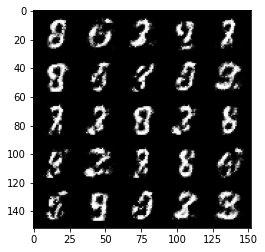

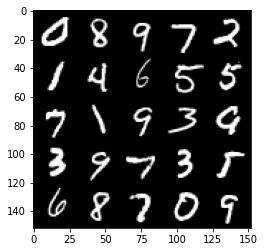

Step 29500: Generator loss: 2.6984312310218814, discriminator loss: 0.20771514233946772


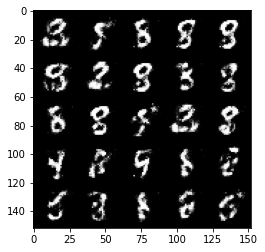

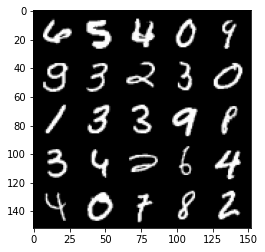

Step 30000: Generator loss: 2.7074818816185005, discriminator loss: 0.21328853274881848


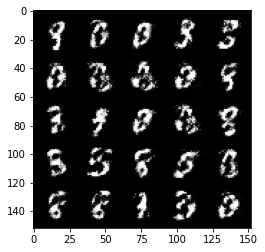

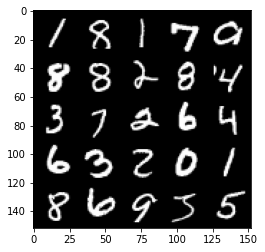

Step 30500: Generator loss: 2.6852106547355645, discriminator loss: 0.21292059276998035


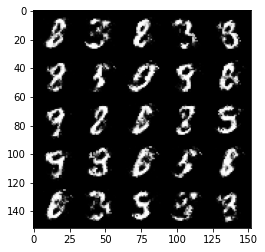

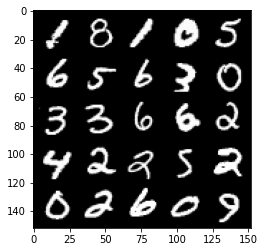

Step 31000: Generator loss: 2.602350953102112, discriminator loss: 0.22286061522364622


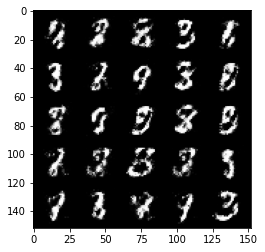

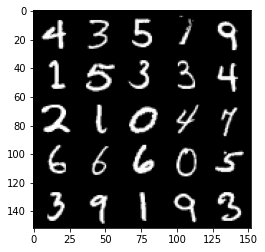

Step 31500: Generator loss: 2.6306536259651194, discriminator loss: 0.20496541668474683


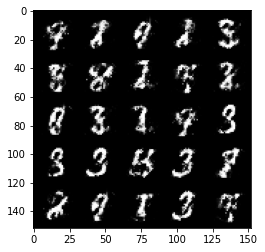

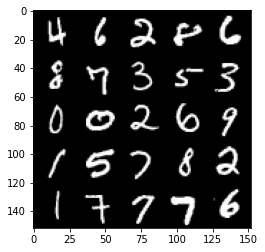

Step 32000: Generator loss: 2.727569324493406, discriminator loss: 0.20395131978392608


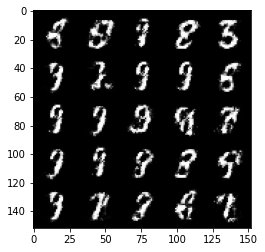

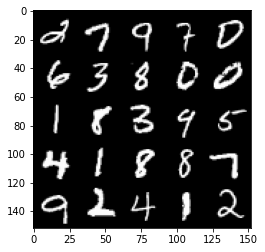

Step 32500: Generator loss: 2.765203871250155, discriminator loss: 0.18376255674660213


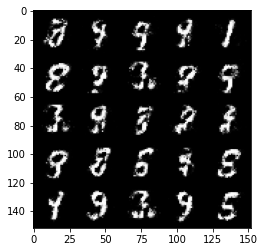

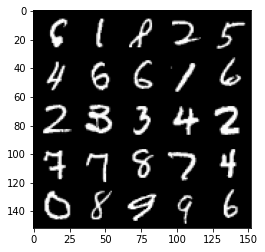

Step 33000: Generator loss: 2.6757302165031436, discriminator loss: 0.22158021336793907


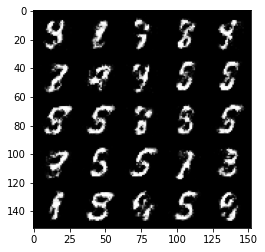

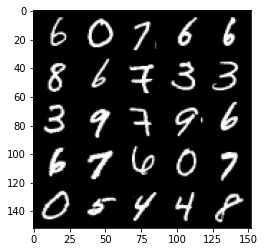

Step 33500: Generator loss: 2.592860753059387, discriminator loss: 0.22400156304240215


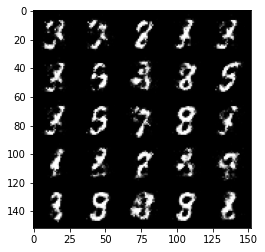

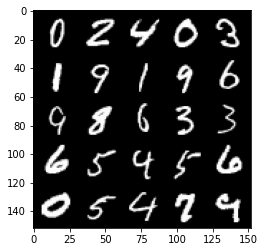

Step 34000: Generator loss: 2.4276208033561697, discriminator loss: 0.24890778326988208


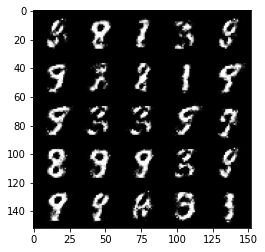

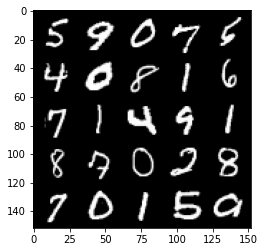

Step 34500: Generator loss: 2.5661289052963254, discriminator loss: 0.2263312257230282


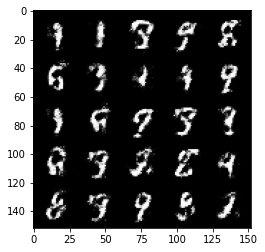

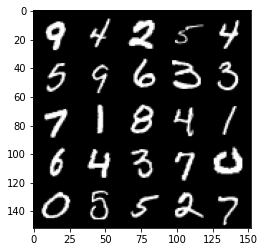

Step 35000: Generator loss: 2.448836069345474, discriminator loss: 0.25567873248457923


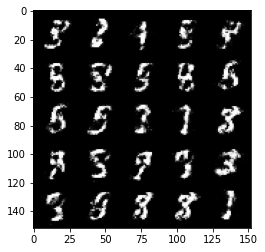

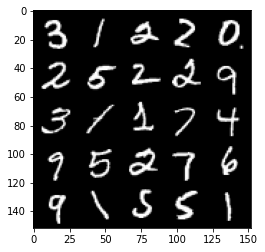

Step 35500: Generator loss: 2.374002951383592, discriminator loss: 0.25743571862578396


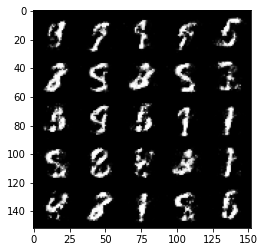

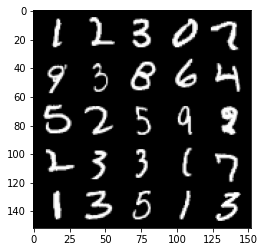

Step 36000: Generator loss: 2.541353168487547, discriminator loss: 0.23280678671598454


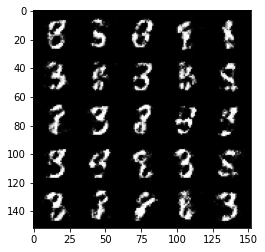

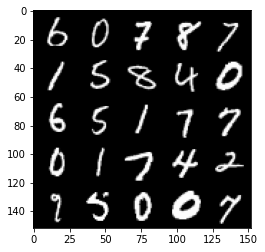

Step 36500: Generator loss: 2.3922732548713683, discriminator loss: 0.25368086254596695


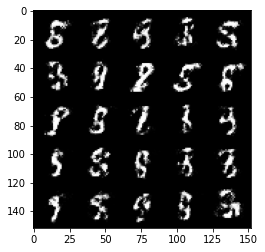

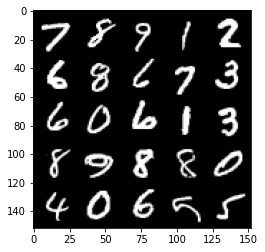

Step 37000: Generator loss: 2.33438306927681, discriminator loss: 0.26694142287969586


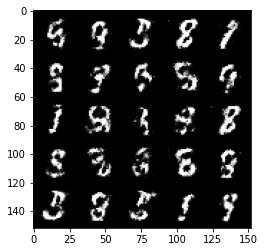

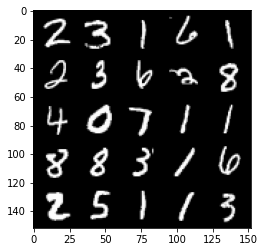

Step 37500: Generator loss: 2.3887386782169333, discriminator loss: 0.2517104417085647


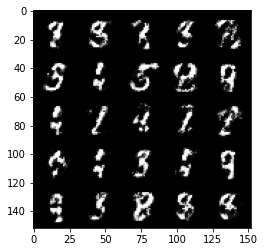

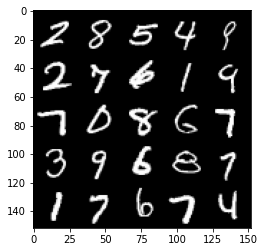

Step 38000: Generator loss: 2.3453257334232327, discriminator loss: 0.260428995102644


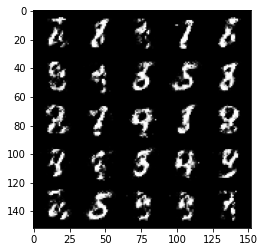

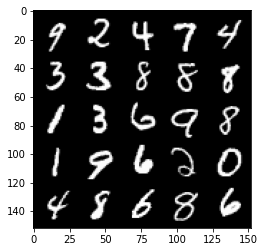

Step 38500: Generator loss: 2.3103081572055806, discriminator loss: 0.27245435479283303


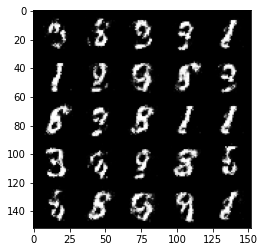

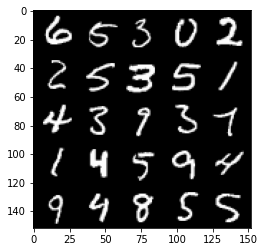

Step 39000: Generator loss: 2.2185048027038565, discriminator loss: 0.2923625089526175


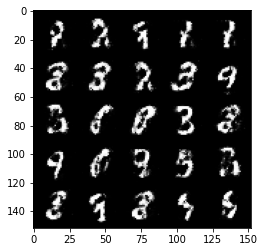

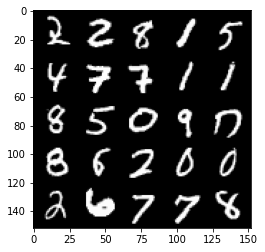

Step 39500: Generator loss: 2.244723149776459, discriminator loss: 0.2836821355819704


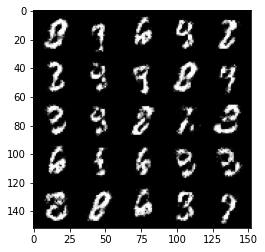

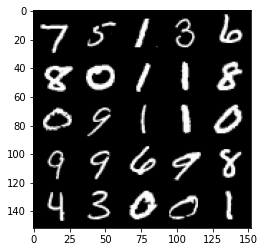

Step 40000: Generator loss: 2.2338723514080043, discriminator loss: 0.27296040686965006


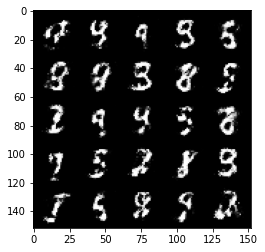

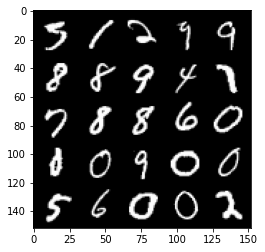

Step 40500: Generator loss: 2.3432902328968046, discriminator loss: 0.2546959264278412


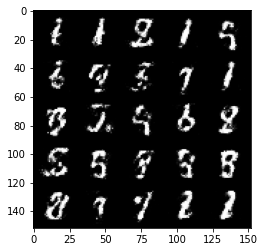

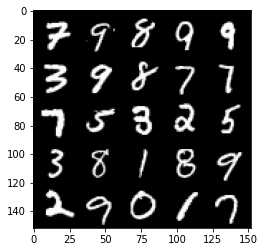

Step 41000: Generator loss: 2.199546698808672, discriminator loss: 0.29324151244759517


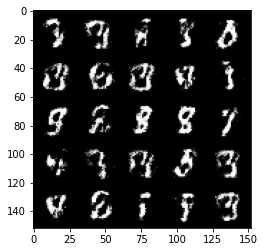

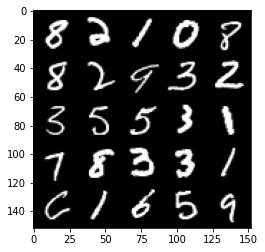

Step 41500: Generator loss: 2.1742654581069925, discriminator loss: 0.29504948756098737


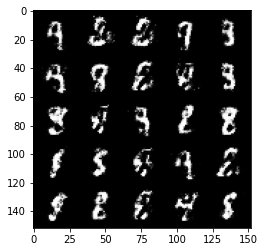

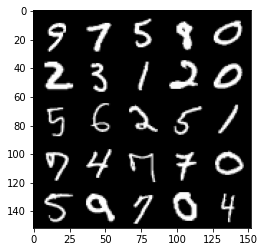

Step 42000: Generator loss: 2.2031365969181076, discriminator loss: 0.2720537728965283


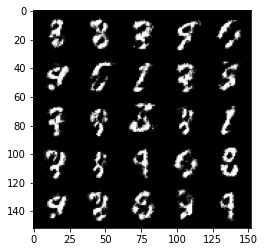

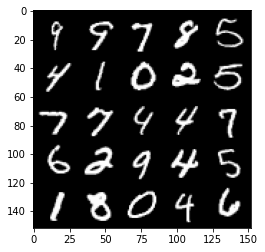

Step 42500: Generator loss: 2.2612054405212416, discriminator loss: 0.2798390384912489


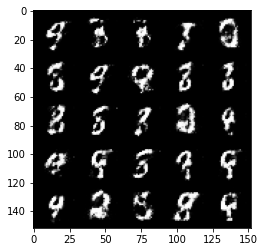

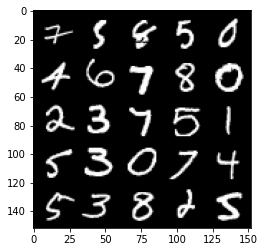

Step 43000: Generator loss: 2.213974556684494, discriminator loss: 0.28406023362278937


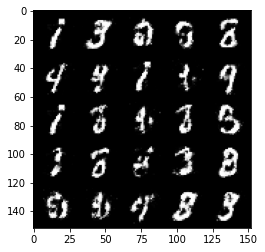

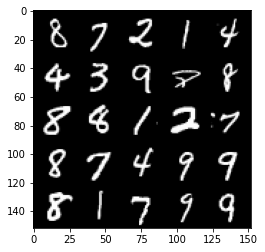

Step 43500: Generator loss: 2.129067006349563, discriminator loss: 0.29234707957506234


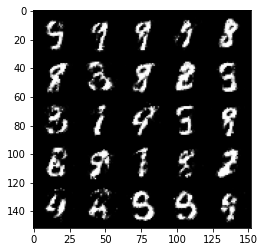

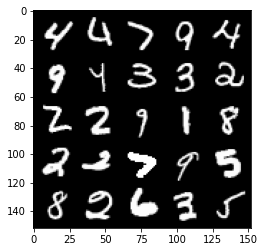

Step 44000: Generator loss: 2.1236604461669915, discriminator loss: 0.29872876885533306


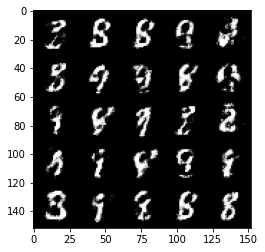

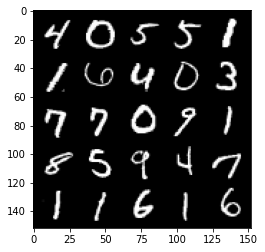

Step 44500: Generator loss: 2.100330543756485, discriminator loss: 0.29963833007216434


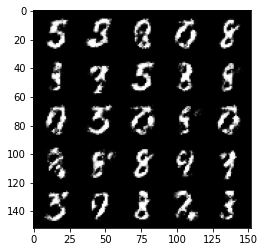

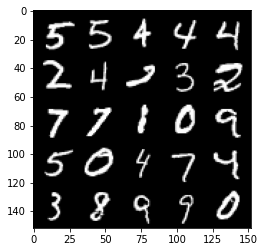

Step 45000: Generator loss: 2.105683165311814, discriminator loss: 0.2933556535840034


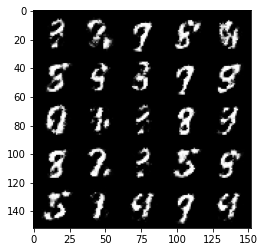

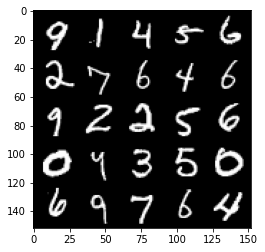

Step 45500: Generator loss: 2.1121720461845395, discriminator loss: 0.29351360496878615


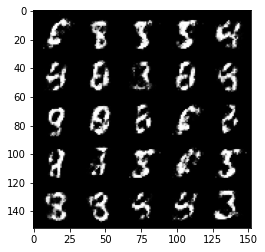

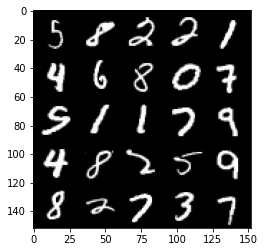

Step 46000: Generator loss: 2.1153153820037836, discriminator loss: 0.2876295588016509


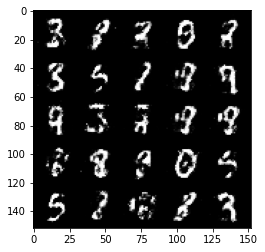

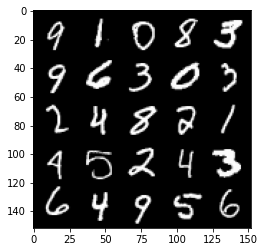

Step 46500: Generator loss: 1.9596375386714935, discriminator loss: 0.33264493474364226


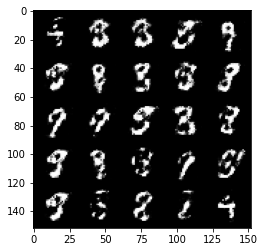

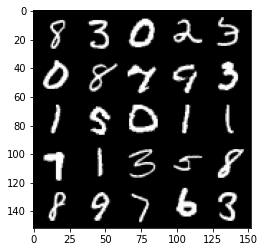

Step 47000: Generator loss: 2.0242319171428695, discriminator loss: 0.31526819068193435


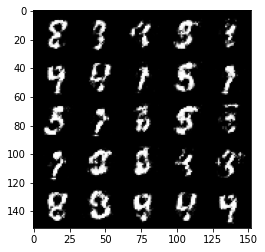

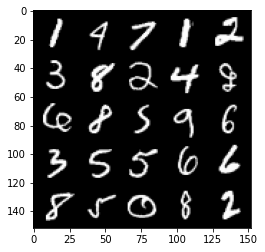

Step 47500: Generator loss: 2.001939966201784, discriminator loss: 0.3031378217935559


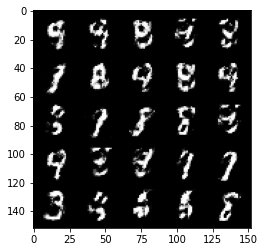

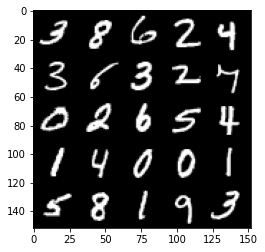

Step 48000: Generator loss: 2.1195850307941453, discriminator loss: 0.29788820323348036


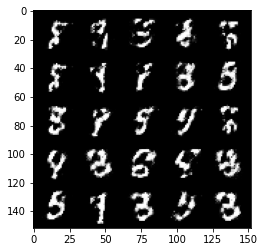

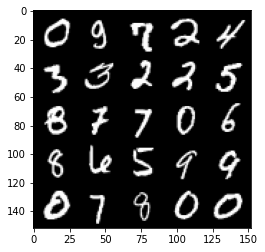

Step 48500: Generator loss: 1.9473557116985307, discriminator loss: 0.31941080448031434


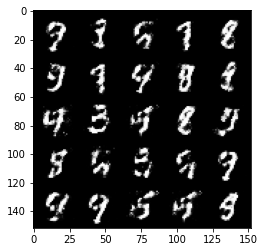

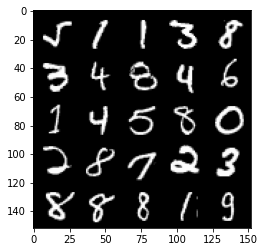

Step 49000: Generator loss: 1.950749969959259, discriminator loss: 0.3264671190083027


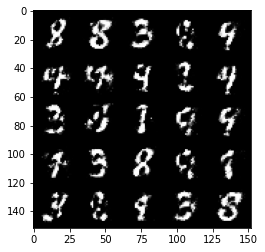

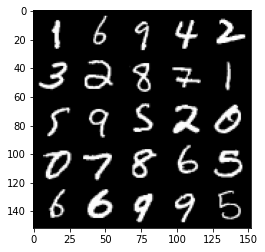

Step 49500: Generator loss: 2.0156239268779745, discriminator loss: 0.3102935836315155


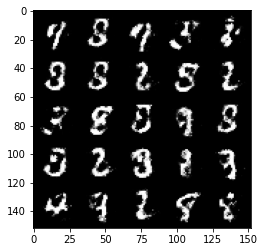

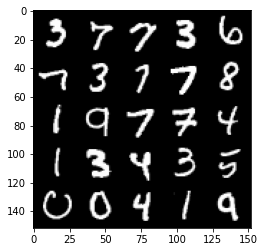

Step 50000: Generator loss: 1.89122920513153, discriminator loss: 0.3511203594207763


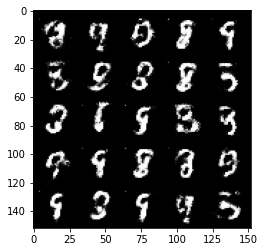

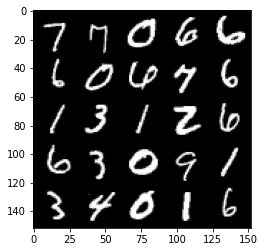

Step 50500: Generator loss: 1.9331627337932578, discriminator loss: 0.32388279312849094


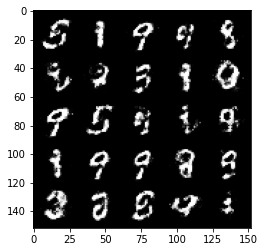

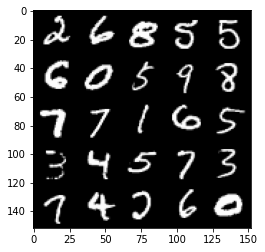

Step 51000: Generator loss: 1.8786801767349242, discriminator loss: 0.3444751617908478


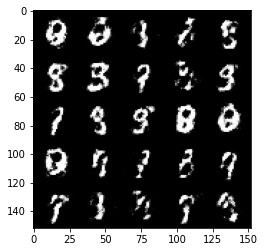

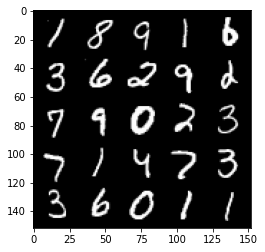

Step 51500: Generator loss: 1.8399767086505892, discriminator loss: 0.34127189862728163


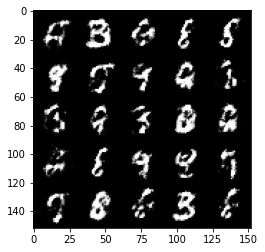

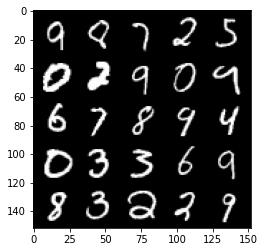

Step 52000: Generator loss: 1.847033219099047, discriminator loss: 0.3332052293419841


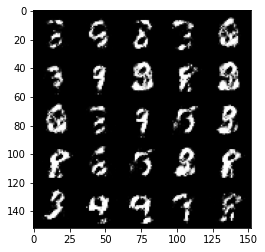

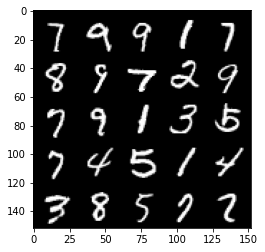

Step 52500: Generator loss: 1.8139813189506548, discriminator loss: 0.37481195560097735


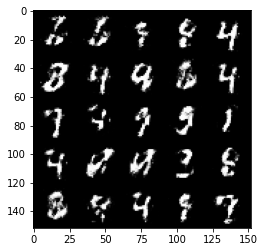

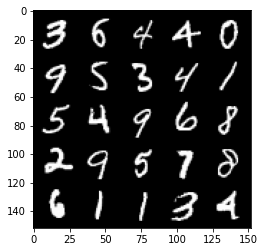

Step 53000: Generator loss: 1.925982553243636, discriminator loss: 0.3229687072634697


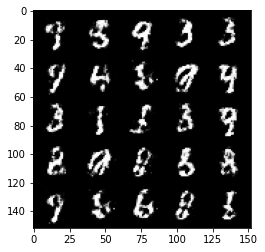

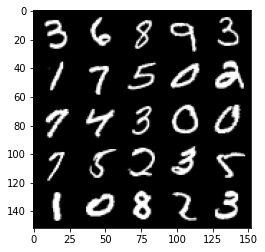

Step 53500: Generator loss: 1.8619927372932426, discriminator loss: 0.3475381466448303


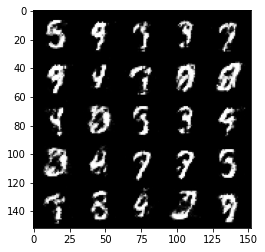

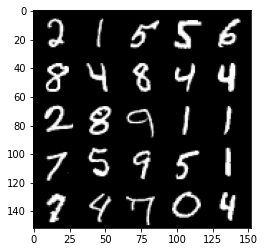

Step 54000: Generator loss: 1.8534611170291895, discriminator loss: 0.3460383322238923


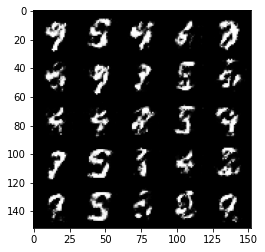

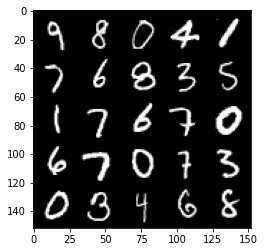

Step 54500: Generator loss: 1.8902997739315024, discriminator loss: 0.33143927615880936


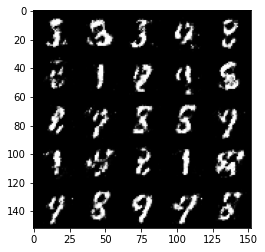

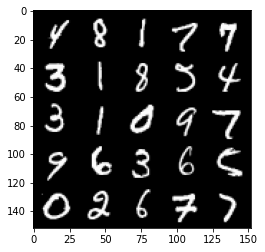

Step 55000: Generator loss: 1.7689979777336127, discriminator loss: 0.35923307818174355


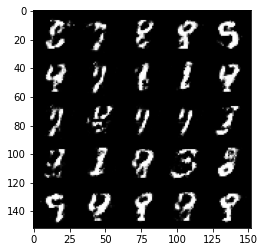

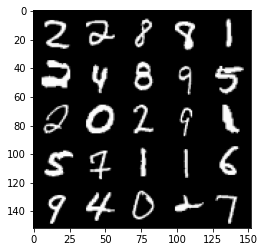

Step 55500: Generator loss: 1.75584013414383, discriminator loss: 0.3562108182609082


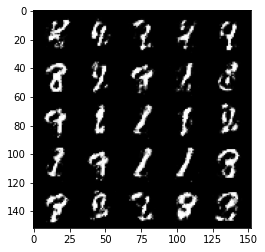

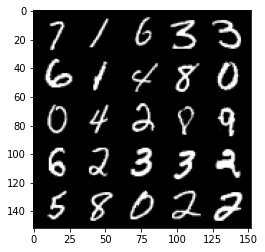

Step 56000: Generator loss: 1.768063419818878, discriminator loss: 0.36462317597866023


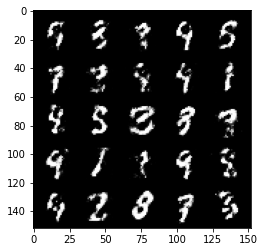

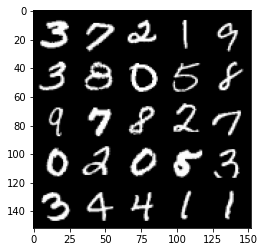

Step 56500: Generator loss: 1.693194853067399, discriminator loss: 0.37109252512455


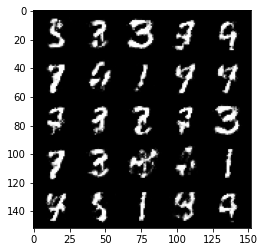

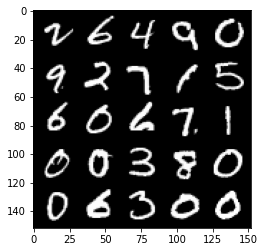

Step 57000: Generator loss: 1.7365061974525458, discriminator loss: 0.36899557948112505


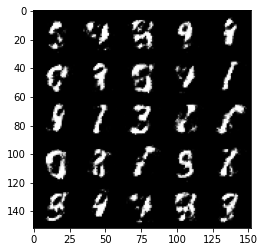

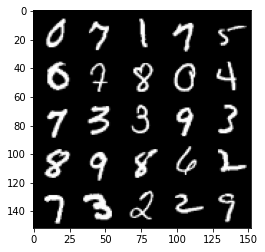

Step 57500: Generator loss: 1.7237472231388122, discriminator loss: 0.3749385333657266


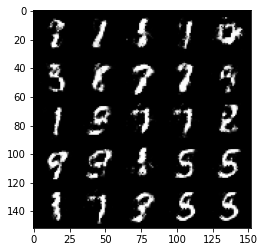

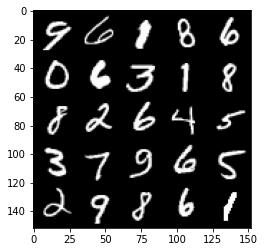

Step 58000: Generator loss: 1.6194136884212509, discriminator loss: 0.398041490674019


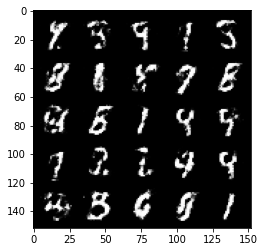

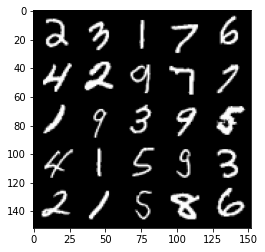

Step 58500: Generator loss: 1.6295822775363924, discriminator loss: 0.383096030950546


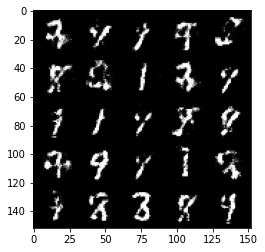

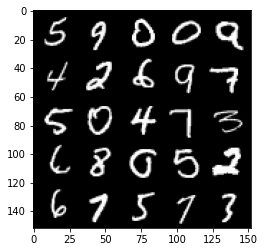

Step 59000: Generator loss: 1.6365837161541004, discriminator loss: 0.3824818403124811


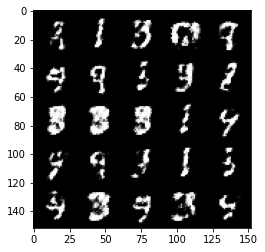

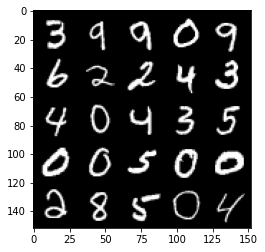

Step 59500: Generator loss: 1.6223021037578589, discriminator loss: 0.389244064092636


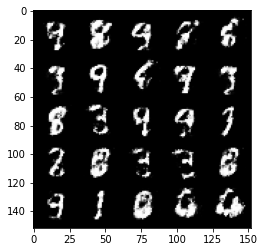

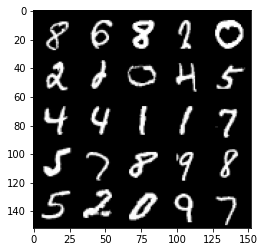

Step 60000: Generator loss: 1.608455824136736, discriminator loss: 0.3905246996283532


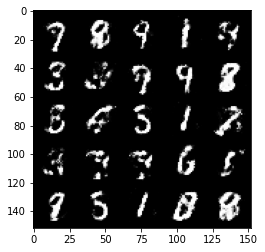

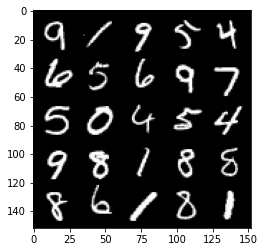

Step 60500: Generator loss: 1.4897573056221014, discriminator loss: 0.4345929459929461


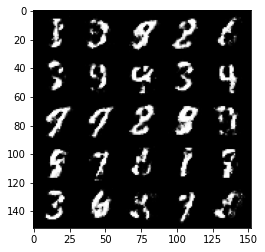

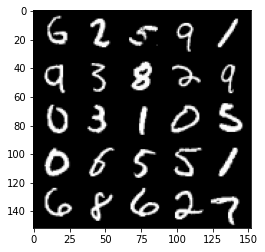

Step 61000: Generator loss: 1.5988834118843085, discriminator loss: 0.39694327062368384


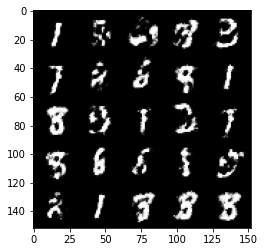

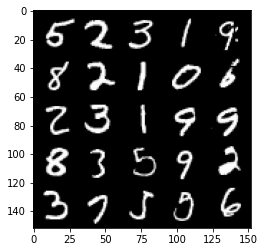

Step 61500: Generator loss: 1.5116186642646794, discriminator loss: 0.42351195400953284


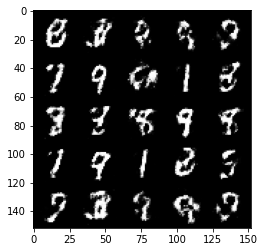

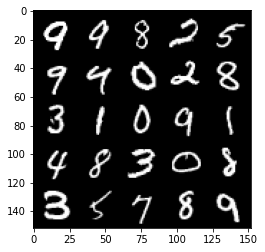

Step 62000: Generator loss: 1.4425965962409963, discriminator loss: 0.43512898671627004


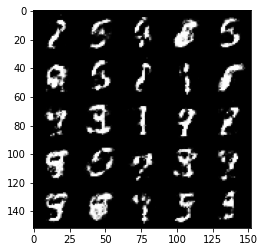

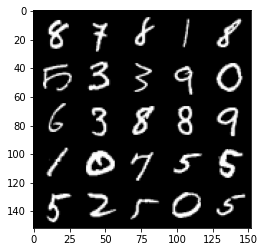

Step 62500: Generator loss: 1.4670611610412596, discriminator loss: 0.42420893734693516


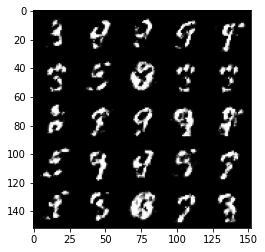

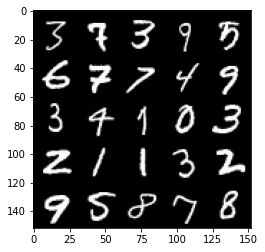

Step 63000: Generator loss: 1.5278754684925075, discriminator loss: 0.4192097220420839


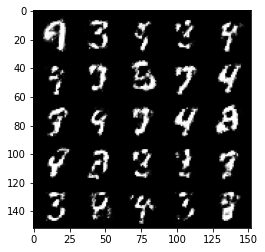

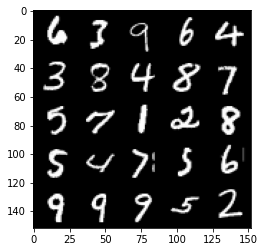

Step 63500: Generator loss: 1.5536182620525356, discriminator loss: 0.41202196073532094


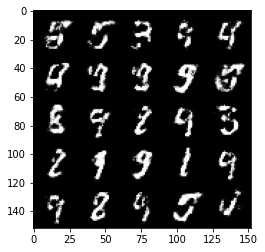

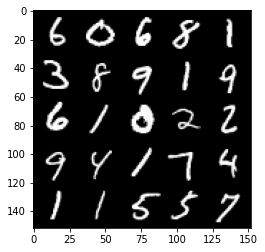

Step 64000: Generator loss: 1.5866851274967186, discriminator loss: 0.4044182516336438


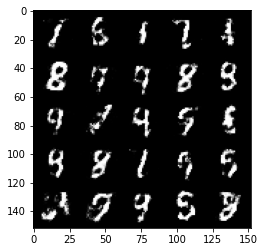

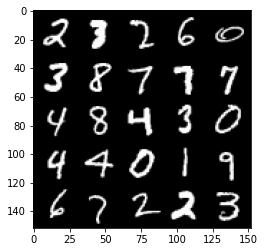

Step 64500: Generator loss: 1.5192642335891726, discriminator loss: 0.412796018302441


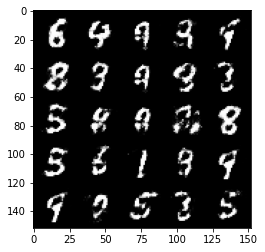

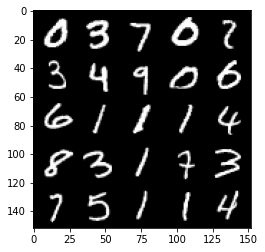

Step 65000: Generator loss: 1.545000492572784, discriminator loss: 0.4171133140325546


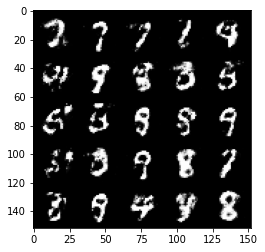

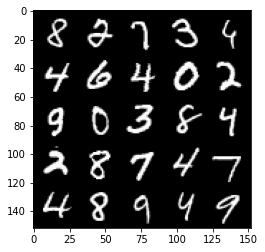

Step 65500: Generator loss: 1.4378576004505157, discriminator loss: 0.430372309863567


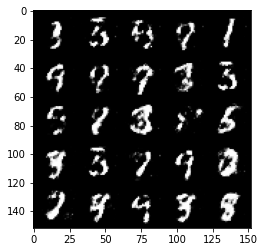

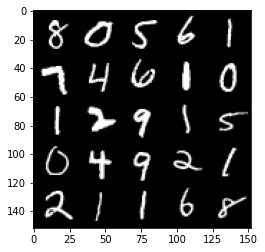

Step 66000: Generator loss: 1.447553589582444, discriminator loss: 0.43110218536853784


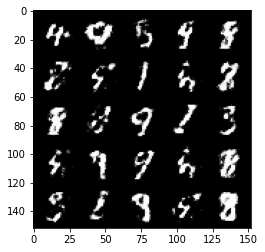

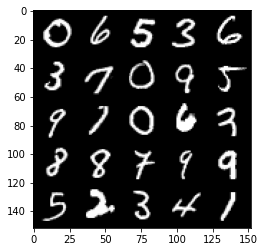

Step 66500: Generator loss: 1.4291249914169302, discriminator loss: 0.43443587952852264


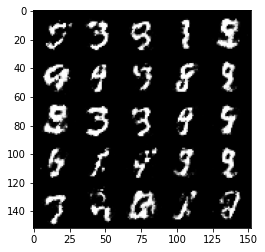

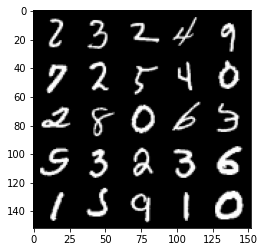

Step 67000: Generator loss: 1.435010666131974, discriminator loss: 0.4323839859962465


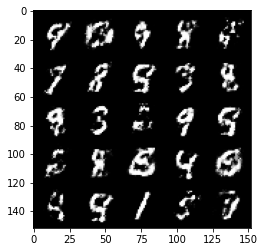

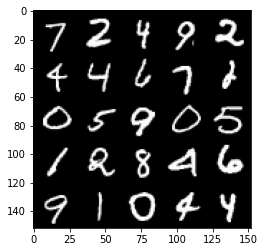

Step 67500: Generator loss: 1.4469289426803595, discriminator loss: 0.42780110061168647


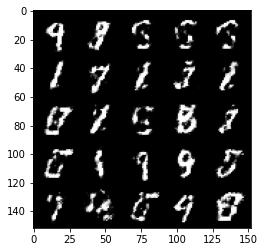

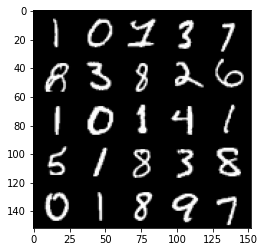

Step 68000: Generator loss: 1.4690379223823544, discriminator loss: 0.4084827597737313


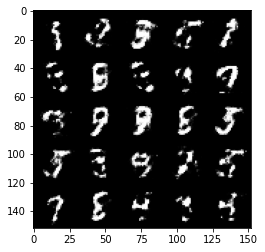

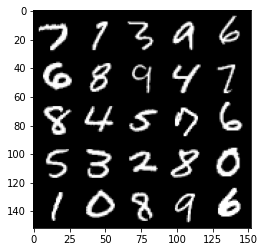

Step 68500: Generator loss: 1.5049963214397428, discriminator loss: 0.4176741273999216


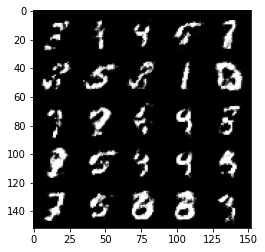

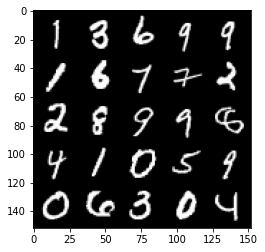

Step 69000: Generator loss: 1.4455068292617792, discriminator loss: 0.429159753739834


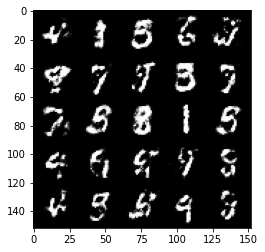

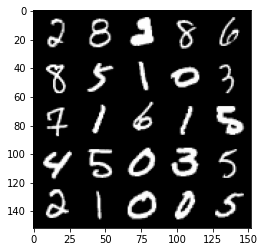

Step 69500: Generator loss: 1.4778487656116495, discriminator loss: 0.431814901351929


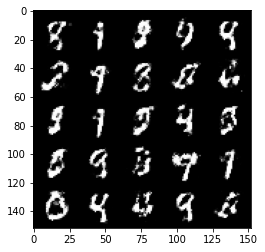

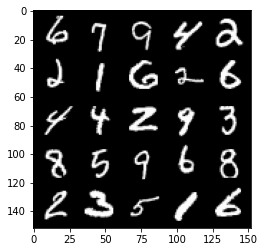

Step 70000: Generator loss: 1.4299192183017728, discriminator loss: 0.4426894692182541


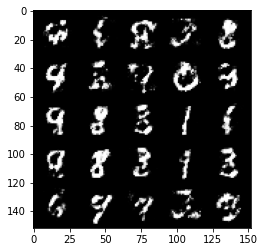

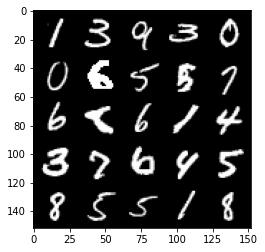

Step 70500: Generator loss: 1.4527300887107852, discriminator loss: 0.4301605250835417


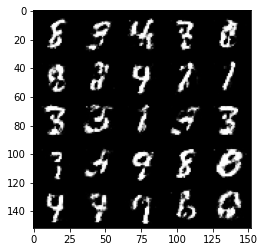

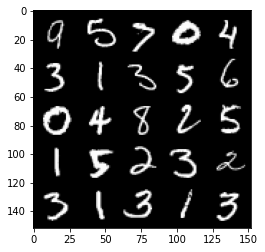

Step 71000: Generator loss: 1.4870717153549204, discriminator loss: 0.4252917363643648


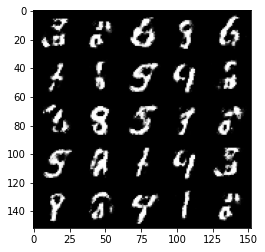

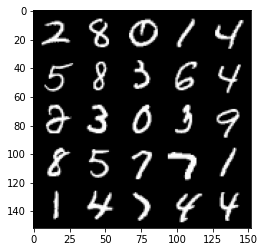

Step 71500: Generator loss: 1.4097280023097984, discriminator loss: 0.4333608542680737


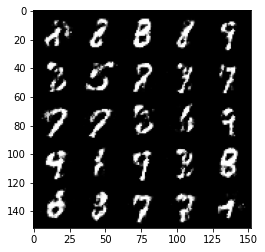

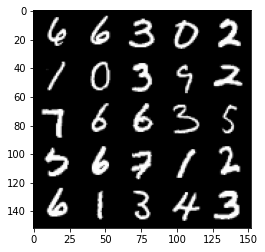

Step 72000: Generator loss: 1.3898677589893338, discriminator loss: 0.44433796405792186


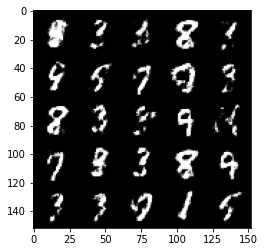

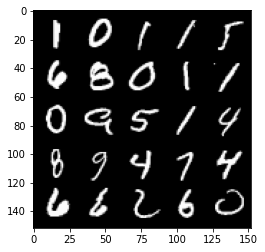

Step 72500: Generator loss: 1.2927242641448977, discriminator loss: 0.4767226893901822


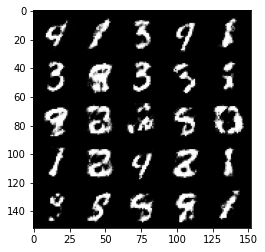

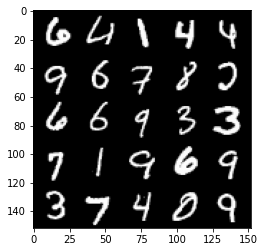

Step 73000: Generator loss: 1.3289696912765516, discriminator loss: 0.45318505930900577


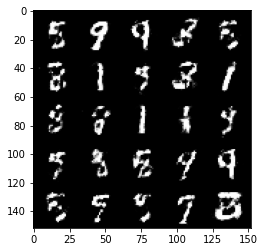

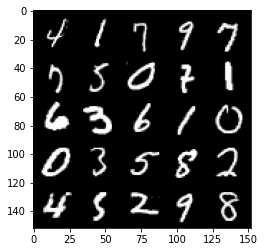

Step 73500: Generator loss: 1.320238708496093, discriminator loss: 0.44609787505865095


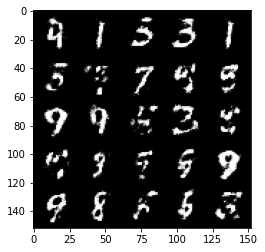

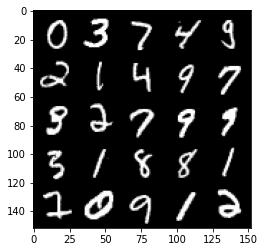

Step 74000: Generator loss: 1.2930539166927348, discriminator loss: 0.46990266776084905


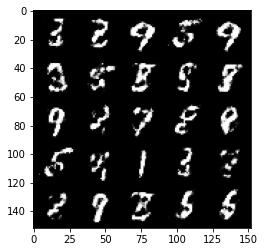

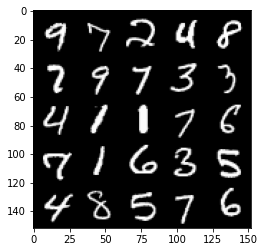

Step 74500: Generator loss: 1.3011084959506984, discriminator loss: 0.4764973403811456


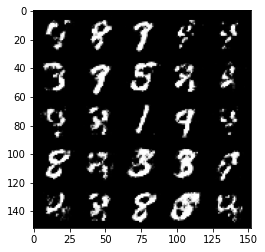

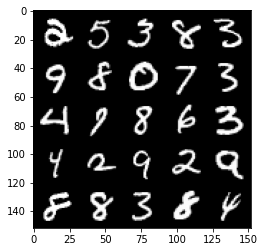

Step 75000: Generator loss: 1.3403301041126239, discriminator loss: 0.462842643737793


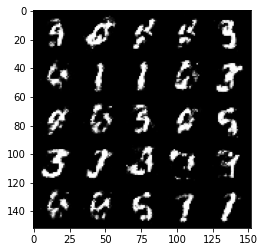

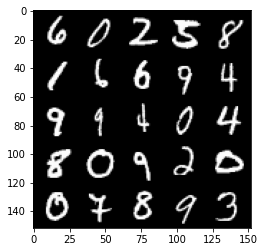

Step 75500: Generator loss: 1.4208666110038746, discriminator loss: 0.4397529650330545


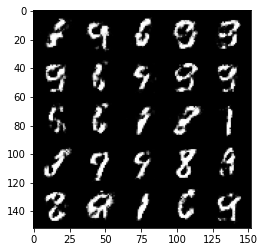

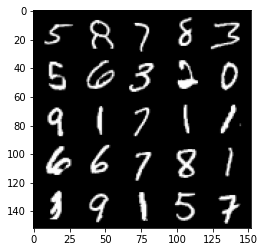

Step 76000: Generator loss: 1.2651245706081393, discriminator loss: 0.4962767537832264


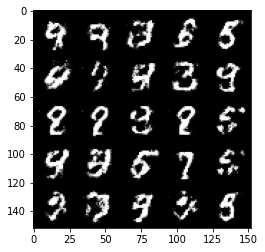

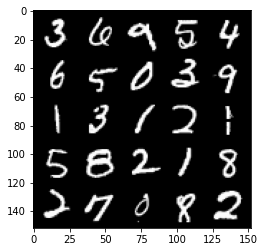

Step 76500: Generator loss: 1.2826510763168333, discriminator loss: 0.47704053854942297


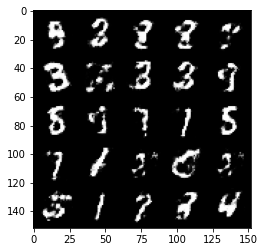

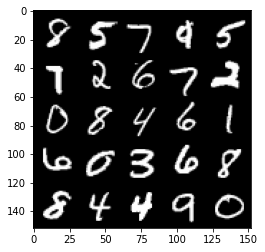

Step 77000: Generator loss: 1.3610129265785236, discriminator loss: 0.4428600206375122


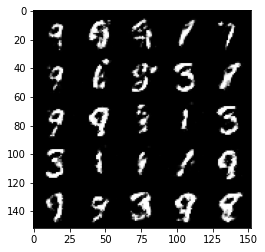

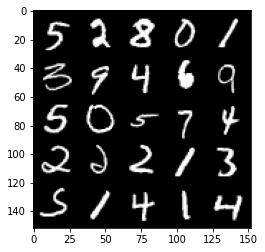

Step 77500: Generator loss: 1.3153306133747102, discriminator loss: 0.4639528577923772


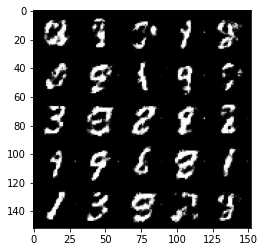

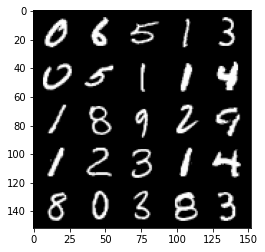

Step 78000: Generator loss: 1.3366838331222546, discriminator loss: 0.4605928459763533


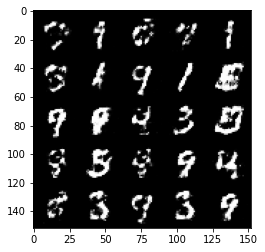

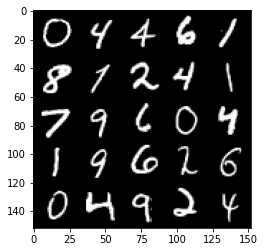

Step 78500: Generator loss: 1.3139101343154902, discriminator loss: 0.46185309731960333


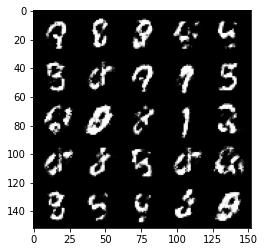

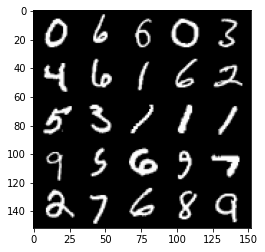

Step 79000: Generator loss: 1.3755943672657016, discriminator loss: 0.44103481280803714


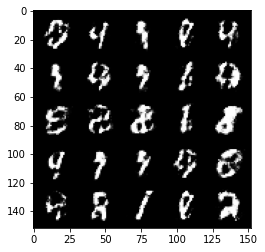

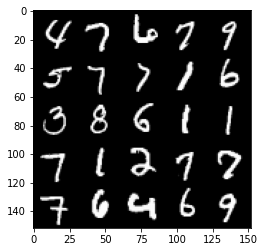

Step 79500: Generator loss: 1.3095160505771621, discriminator loss: 0.4706612532734871


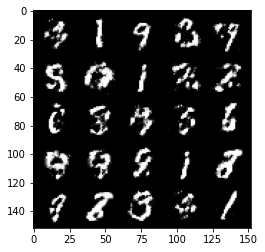

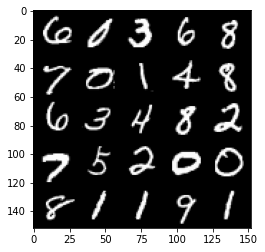

Step 80000: Generator loss: 1.3148402335643754, discriminator loss: 0.4674160002470016


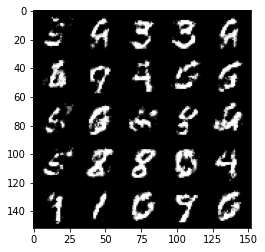

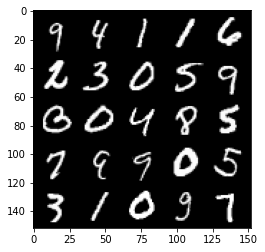

Step 80500: Generator loss: 1.238991080760956, discriminator loss: 0.48211121356487285


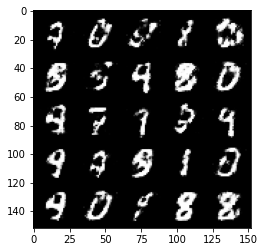

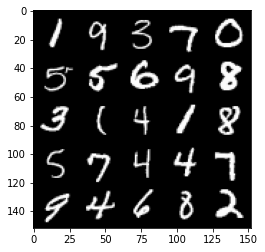

Step 81000: Generator loss: 1.2341726944446558, discriminator loss: 0.48797885209322045


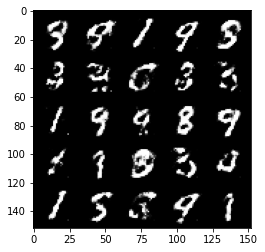

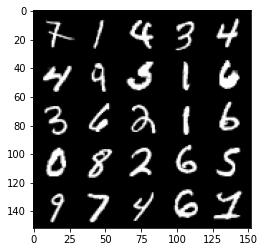

Step 81500: Generator loss: 1.3172587678432446, discriminator loss: 0.45440424400567975


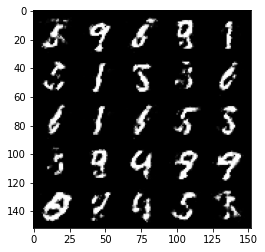

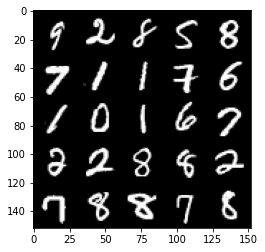

Step 82000: Generator loss: 1.3446771125793457, discriminator loss: 0.46134238010644923


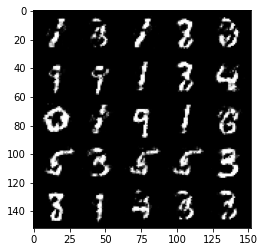

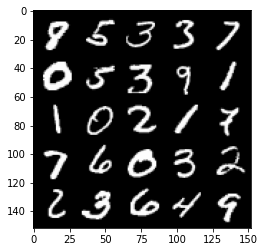

Step 82500: Generator loss: 1.2054096517562867, discriminator loss: 0.49850791114568704


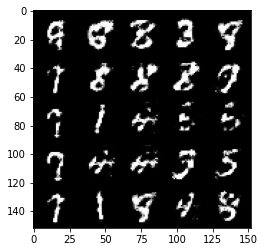

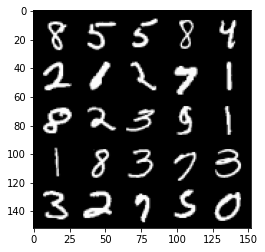

Step 83000: Generator loss: 1.2518935632705683, discriminator loss: 0.4786848344206808


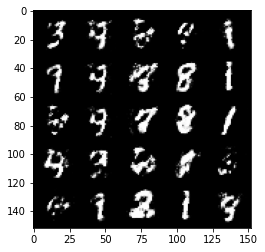

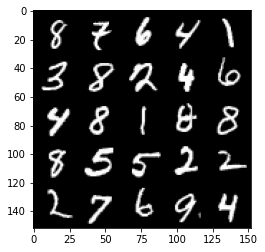

Step 83500: Generator loss: 1.2248310668468474, discriminator loss: 0.4751013824343681


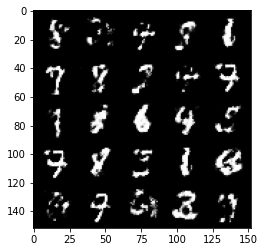

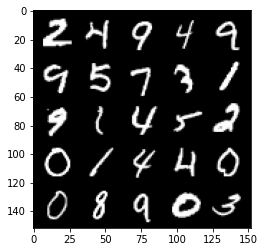

Step 84000: Generator loss: 1.2593921790122993, discriminator loss: 0.4685977805852889


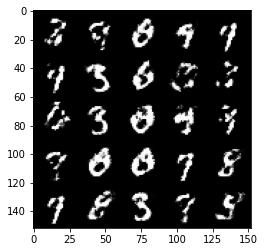

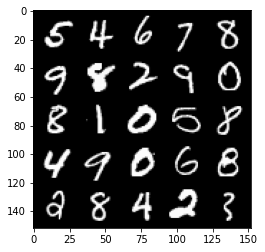

Step 84500: Generator loss: 1.291177420616151, discriminator loss: 0.46503589165210696


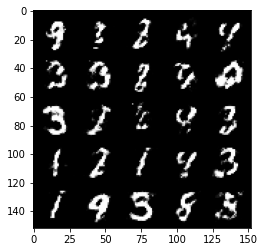

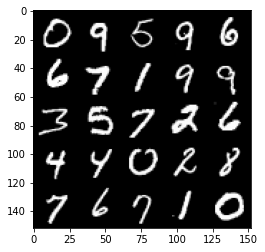

Step 85000: Generator loss: 1.2853862628936754, discriminator loss: 0.459842741906643


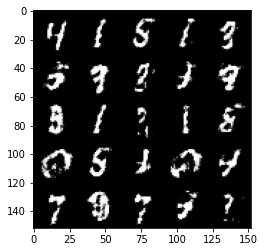

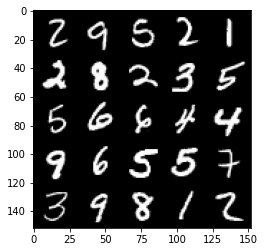

Step 85500: Generator loss: 1.3552756969928743, discriminator loss: 0.43193626850843453


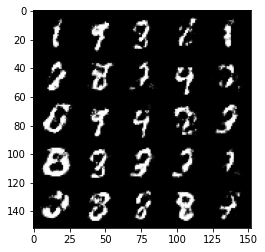

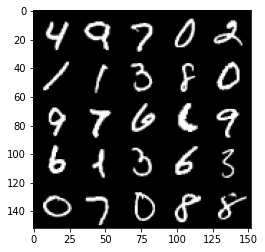

Step 86000: Generator loss: 1.3489421973228453, discriminator loss: 0.451154326736927


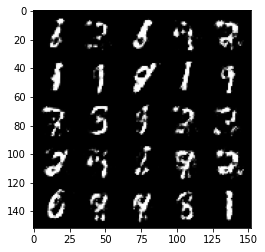

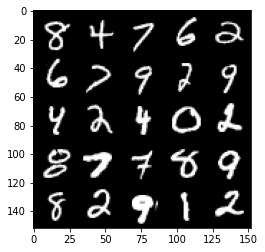

Step 86500: Generator loss: 1.346193981170653, discriminator loss: 0.44819339573383327


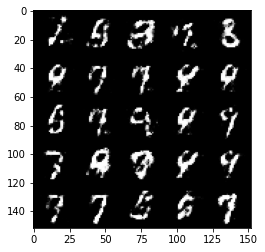

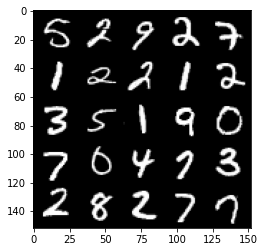

Step 87000: Generator loss: 1.2395311691761006, discriminator loss: 0.4842437211275099


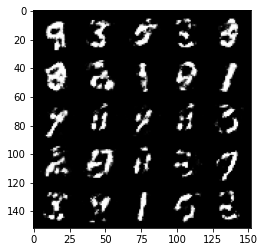

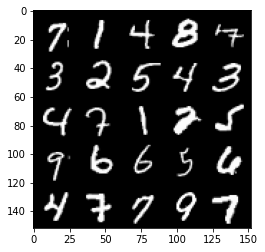

Step 87500: Generator loss: 1.23386624288559, discriminator loss: 0.4684736156463626


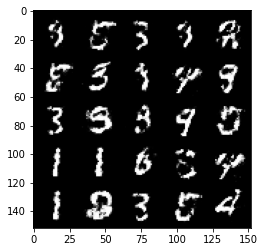

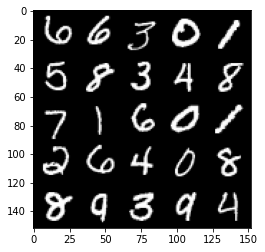

Step 88000: Generator loss: 1.28330707526207, discriminator loss: 0.4725153409838672


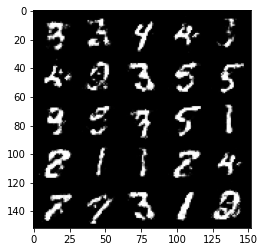

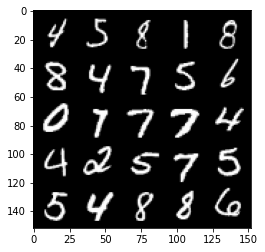

Step 88500: Generator loss: 1.263250437498093, discriminator loss: 0.4780039329528804


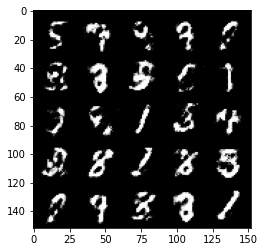

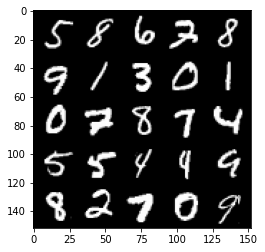

Step 89000: Generator loss: 1.2121294505596145, discriminator loss: 0.48646999311447153


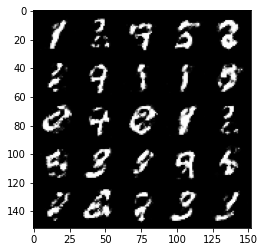

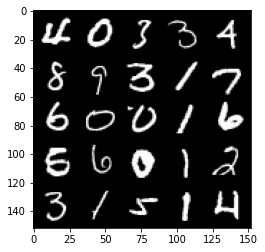

Step 89500: Generator loss: 1.2672927415370927, discriminator loss: 0.45931419396400486


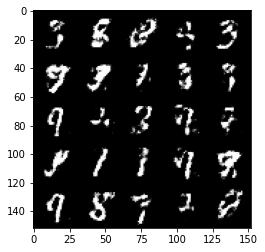

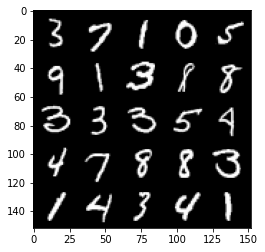

Step 90000: Generator loss: 1.243674540281294, discriminator loss: 0.4715975393652918


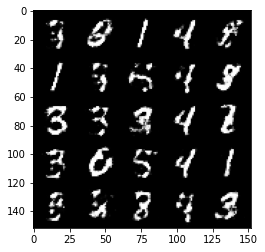

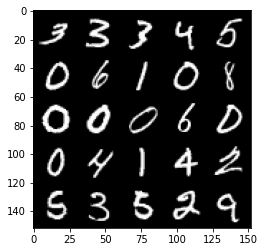

Step 90500: Generator loss: 1.2962272152900702, discriminator loss: 0.4677645201683045


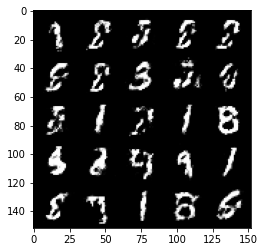

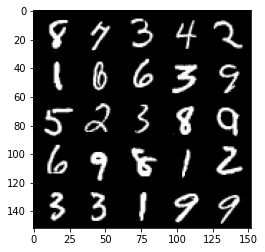

Step 91000: Generator loss: 1.309590058565139, discriminator loss: 0.45592025804519654


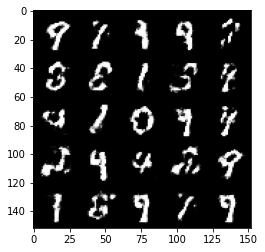

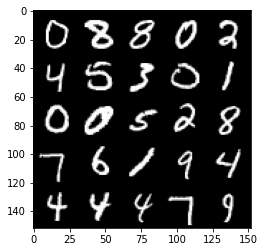

Step 91500: Generator loss: 1.3283865365982062, discriminator loss: 0.45150405812263444


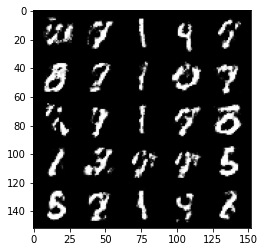

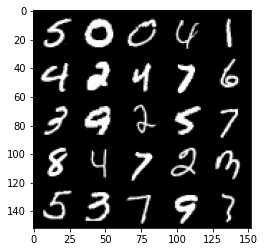

Step 92000: Generator loss: 1.3385851681232466, discriminator loss: 0.45189245045185084


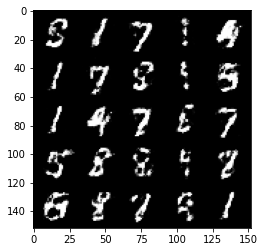

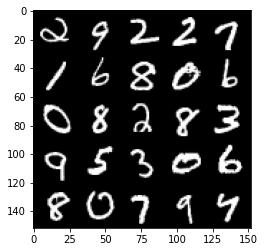

Step 92500: Generator loss: 1.2858243651390087, discriminator loss: 0.4664307481050488


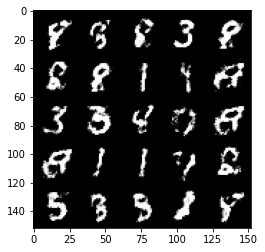

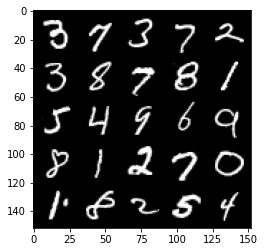

Step 93000: Generator loss: 1.3263494436740881, discriminator loss: 0.4424955257773397


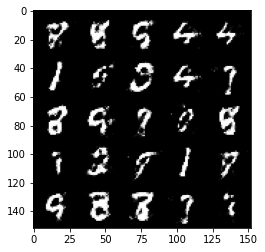

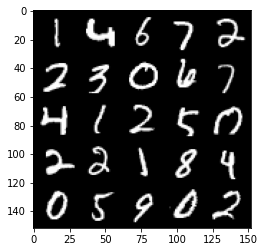

Step 93500: Generator loss: 1.3175278339385987, discriminator loss: 0.4549789266586304


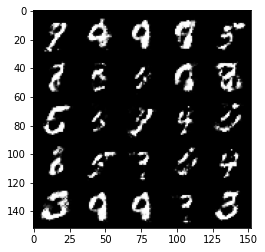

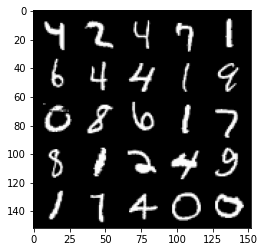

In [25]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
